In [9]:
import cv2
import matplotlib.pyplot as plt
import deepdish as dd
import numpy as np
from util.reconstruction import Class_3D

sensor_id = "W00"
model_id = "RGB"
model_fn = f"models/LUT_{sensor_id}_{model_id}.pkl"
c3d = Class_3D(model_fn=model_fn, features_type=model_id)

def imshow(im, vmin=0, vmax=1):
    plt.imshow(im[:,:,::-1], vmax=vmax, vmin=vmin)
    plt.show()

frames = dd.io.load("data/cable.h5")

In [10]:
import imutils
from numpy import sin, cos
from scipy import ndimage

def render(depth, k=0.35):
    gy, gx = np.gradient(depth)

    rendered_img = np.zeros(frame.shape)
    theta_x = np.arctan(gx*5)
    theta_y = np.arctan(gy*5)

    rendered_img[:,:,1] = np.cos(np.pi / 2 - theta_x) * k * 1.2
    rendered_img[:,:,0] = np.cos(np.pi / 2 + theta_y) * k / 2
    rendered_img[:,:,2] = np.cos(np.pi / 2 - theta_y) * k * 1

    rendered_img[:,:,1] += 0.03
    return rendered_img

def blend(img, mask, rng=30):
    distance = ndimage.distance_transform_edt(1 - mask)
    distance_clip = 1 / (1 + np.exp(-(distance - rng) / 10)) 

    distance_clip = 1 - distance_clip
    distance_clip_RGB = np.dstack([distance_clip, distance_clip, distance_clip])

    img_blur = cv2.GaussianBlur(img, (185,185), 0)

    img_mix = distance_clip_RGB * img_blur + (1 - distance_clip_RGB) * img
    return img_mix


def transform(depth, theta, dx, dy, depth_max=10):    
    rows, cols = depth.shape[:2]
    
    depth_img = np.dstack([depth / depth_max] * 3)


    M = cv2.getRotationMatrix2D((cols/2, rows/2), theta, 1)
    M[:, 2] += [dx, dy]

    shifted = cv2.warpAffine(depth_img, M, (cols, rows))

#     generate mask
    mask = np.ones(depth_img.shape)
    mask = cv2.warpAffine(mask, M, (cols, rows))

    mask = 1 - mask[:,:,0]
    
    return shifted, mask, M

def draw_line(img, theta, x0, y0):
    theta = theta / 180. * np.pi
    img = img.copy()
    rows, cols = img.shape[:2]
    
    center = np.array([x0 * cols, y0 * rows])
    
    d = 1100
    
    start_point = center + (d * sin(theta), d * cos(theta))
    end_point = center - (d * sin(theta), d * cos(theta))
    
    start_point = tuple(start_point.astype(np.int))
    end_point = tuple(end_point.astype(np.int))

    color = (0, 0, 1)
    thickness = 4
    
    img = cv2.line(img, start_point, end_point, color, thickness) 
    return img

frame0 = frames[0]
frame = frames[280]
# frame = frames[460]

diff = (frame * 1.0 - frame0) / 255. + 0.5
diff_img = (diff - 0.5) * 4 + 0.5

# Get depth
depth, gx, gy = c3d.infer(diff * 255.0, display=False)

# Get label
theta0 = 28
x0, y0 = (169, 145)

# Transform
theta = 30
dx, dy = 20, 0
depth_max = 10

rows, cols = frame.shape[:2]

X = []
Y = []

# for theta in range(-120, 61, 30):
# for theta in [0]:
for i in range(10000):
# for i in range(100):
    theta = np.random.random() * 360 - 180
    dx, dy = np.random.random() - 0.5, np.random.random() - 0.5
    dx, dy = dx * cols * 0.5, dy * rows * 0.5
    
#     depth_augmented = (depth)
    depth_augmented = (depth - depth.max() * np.random.random() * 0.95)
    depth_augmented = np.maximum(depth_augmented, 0)
    
    shifted, mask, M = transform(depth_augmented, theta, dx, dy, depth_max=depth_max)

    img_mix = blend(shifted, mask)
    rendered_img = render(img_mix[:,:,0] * depth_max)

    noise = np.random.normal(0, 0.03, size=rendered_img.shape)
    rendered_img += noise

#     draw line
    theta1 = theta0 + theta
    while theta1 > 90:
        theta1 -= 180
    while theta1 < -90:
        theta1 += 180
    
    X0 = np.array([[x0], [y0], [1.]])
    X1 = M.dot(X0)
    x1, y1 = X1[0, 0] / cols, X1[1, 0] / rows
    
#     plt.figure()
    rendered_img_line = draw_line(rendered_img + 0.5, theta1, x1, y1)
    
    rendered_small = cv2.resize(rendered_img + 0.5, (120, 90))
#     imshow(rendered_small)
    
    X.append(rendered_small)
    Y.append([x1, y1, theta1])
    
    if i % 100 == 0:
        print(i)
#     imshow(rendered_img + 0.5)

6.8977594
0
100
200
300
400
500
600
700
800
900
1000
1100
1200
1300
1400
1500
1600
1700
1800
1900
2000
2100
2200
2300
2400
2500
2600
2700
2800
2900
3000
3100
3200
3300
3400
3500
3600
3700
3800
3900
4000
4100
4200
4300
4400
4500
4600
4700
4800
4900
5000
5100
5200
5300
5400
5500
5600
5700
5800
5900
6000
6100
6200
6300
6400
6500
6600
6700
6800
6900
7000
7100
7200
7300
7400
7500
7600
7700
7800
7900
8000
8100
8200
8300
8400
8500
8600
8700
8800
8900
9000
9100
9200
9300
9400
9500
9600
9700
9800
9900


In [11]:
data = {"X": np.array(X), "Y": np.array(Y)}
dd.io.save("dataset/cable_pose.h5", data)

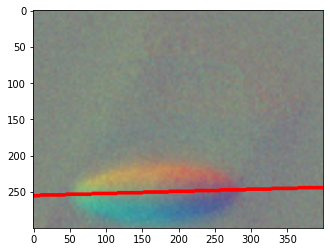

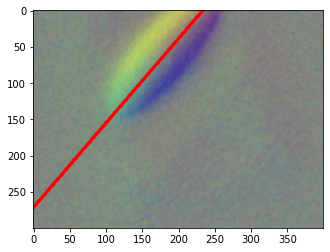

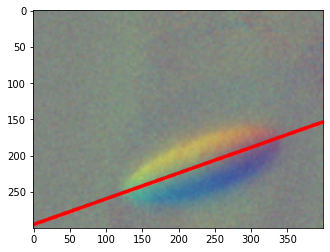

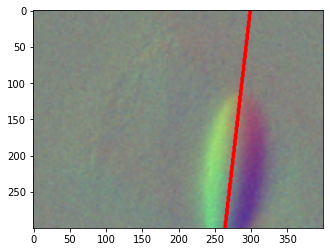

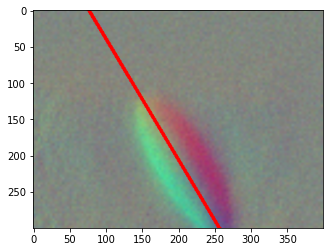

...

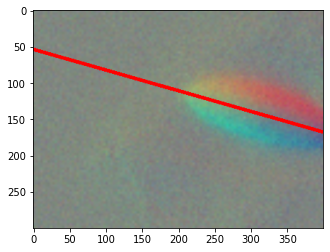

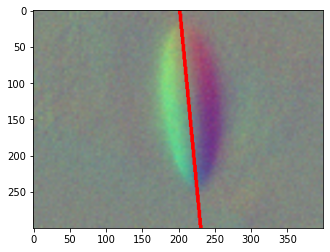

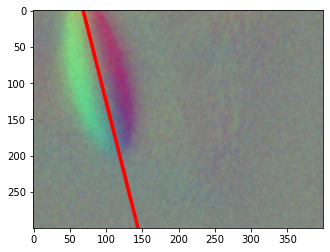

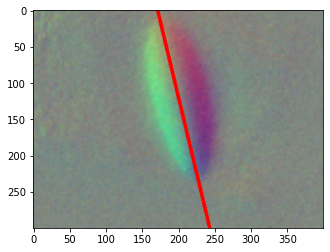

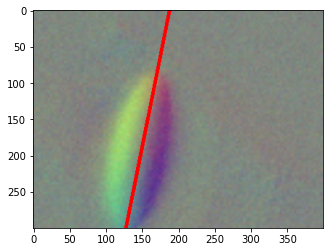

In [8]:

for x, y in zip(X, Y):
    x = cv2.resize(x, (400, 300))
    rendered_img_line = draw_line(x, y[2], y[0], y[1])
    imshow(rendered_img_line)
    